<a href="https://colab.research.google.com/github/LUS24/reinforcement_learning/blob/main/Gym_OpenAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gym - OpenAI

Esta libreria proporciona una coleccion de **environments** para desarrollar un proyecto de reinforcement learning. El **agente** no esta incluido, uno lo debe programar y en ese sentido es agnostico.

In [2]:
# Instalacion de librerias para la visualizacion de resultados en Google Colab
!apt update > /dev/null 2>&1
!apt install xvfb > /dev/null 2>&1
!pip install pyvirtualdisplay > /dev/null 2>&1

In [3]:
# Reinforcement Learning
import gym

# Visualizacion
from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

In [4]:
d = Display()
d.start()

## El Environment


Todos los Environments descienden de la clase base **Env**.

[Lista de environments](https://gym.openai.com/envs/#classic_control)

In [5]:
# Selecciono el ENVIRONMENT en donde quiero entrenar mi agente. 
env = gym.make('CartPole-v0')

In [6]:
# El espacio "Discrete" permite un rango fijo de valores no negativos.
# En este caso las acciones validas en un espacio "Discrete(2)" son o bien "0" o "1" 
print(env.action_space)

Discrete(2)


In [7]:
# El espacio "Box" representa un espacio n-dimensional.
# Los valores validos seran un array de 4 numeros
print(env.observation_space)

Box(-3.4028234663852886e+38, 3.4028234663852886e+38, (4,), float32)


In [8]:
# Tambien se puede chequear el rango de valores de "Box"

print(env.observation_space.low)
print(env.observation_space.high)

[-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38]
[4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38]


In [9]:
img = []
for i_episode in range(10):
    observation = env.reset()
    for t in range(100):
        print(observation)
        action = env.action_space.sample() # Take action from DNN in actual training.
        observation, reward, done, info = env.step(action)
        display.clear_output(wait=True)
        img.append(env.render('rgb_array'))
        #if done:
        #    print("Episode finished after {} timesteps".format(t+1))
        #    break
env.close()

[  2.52610568   3.14940926 -12.68668762  -9.67771369]


## Visualizacion del resultado



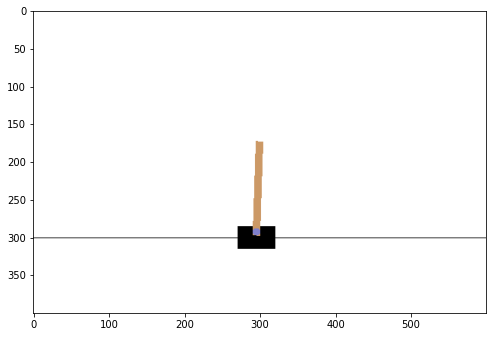

In [10]:
dpi = 72
interval = 50 # ms

plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))